## TS4 - Camila Belen Smith
## Primeras nociones de estimación espectral.

Ultima Actualizacion: 15/4 falta conclusion final

Primero Simule la señal con el ruido considerando:

$SNR = \frac{P_{s}}{P_{nn}} $ siendo $s:señal$ y $nn: ruido$

La consigna dice SNR = 10 y SNR = 3. Hice el desarrollo largo del trabajo con SNR = 10 y al final compare con 3. 
Mas alla de SNR, mi idea era ver como afectan las diferentes ventanas al espectro. Ver que pasa cuando hago padding. Y bueno obvio ademas estimar $a$ y estimar $\omega$ 

PD: arme varias funciones asi el codigo no quedaba tan cargado 

aunque quedo mega cargado :(

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import pandas as pd

In [2]:
def gen_fft(xk,fs,cte =None, axis=0): #Este lo describo bien xq seguro lo voy a volver a usar en la materia :) asi me queda :)
    """
    Calcula la FFT normalizada, la grilla espectral y el filtro (Bool) de Nyquist para quedarme con la mitad (ya que la FFT es simetrica)
    inputs :)
    
    xk : Señal de entrada (puede ser un vector o matriz)
    fs : Frecuencia de muestreo [Hz]
    cte : Cantidad de puntos a calcular en la FFT (por defecto N) pero para padding se puede cambiar :)
    axis : Eje a lo largo del cual se calcula la FFT (por defecto 0)

    outputs :)
    Xk_fft : FFT normalizada (espectro)
    ffx : Grilla espectral [Hz]
    bfrec : Filtro de Nyquist (booleano) (True si la frecuencia es menor a fs/2)
   
    """
    N = xk.shape[axis] 
    if cte is None:
            cte = N

    df = fs / cte

    Xk_fft = np.fft.fft(xk,n = cte, axis=axis) / N  
    ffx = np.linspace(0, (cte-1)*df, cte)
    bfrec = ffx <= (fs / 2)
    return Xk_fft, ffx, bfrec, df

def plot_temp(xx,t, repes, title, xlabel, ylabel):
    for i in range(repes): 
        plt.plot(t, xx[:,i], alpha=0.5)
    plt.title(title)
    plt.xlabel(xlabel)  
    plt.ylabel(ylabel)
    plt.grid()

def plot_freq(Xk_fft, ffx,repes, bfrec, title, xlabel, ylabel):
    for i in range(repes):
        plt.plot(ffx[bfrec], 10 * np.log10(2 * np.abs(Xk_fft[bfrec, i])**2), alpha=0.5)
    
    plt.title(title)
    plt.xlabel(xlabel)  
    plt.ylabel(ylabel)
    plt.grid()

def estimador_a(Xk_fft, f0):
     '''
     a_est: vector de amplitudes estimadas
     a_media: media de las amplitudes estimadas
     a_var: varianza de las amplitudes estimadas

     '''

     lim = int(f0) 
     a_est = np.abs(Xk_fft[lim, :])
     a_media = np.mean(a_est)
     a_var = np.var(a_est)
     return a_est, a_media, a_var

def estimador_w(X_fft, bfrec, df):
    z = np.argmax(np.abs(X_fft[bfrec, :]), axis=0) * df
    z_media = np.mean(z)
    z_var = np.var(z)
    return z, z_media, z_var


#### Datos Simulacion

In [3]:
repes = 200 #Son las realizaciones del experimento
a1= np.sqrt(2) #para q la señal sea normalizada (TS3)
N=1000
fs=1000
ts=1/fs
df = fs/N

## Armado de matrices

#### Matriz de ruido

In [4]:
SNR= 10
SNR_2 = 3
Pot_nn =10**(-SNR / 10) # Viene de (*)
Pot_nn_2 = 10**(-SNR_2 / 10) # Viene de (*)
verifico = - 10 * np.log10(Pot_nn)
print('SNR: ',verifico)
N = 1000
sigma = np.sqrt(Pot_nn)
sigma_2 = np.sqrt(Pot_nn_2)
nn = np.random.normal(0, sigma, (N,repes)) #[1000 X 200]
nn_2 = np.random.normal(0, sigma_2, (N,repes)) #[1000 X 200]

SNR:  10.0


( * ) $SNR_{dB}  = 10 Log_{10} \frac{P_s}{P_n} $ Si depejo $P_n$ obtengo lo de (*)

Siendo $P_s$ la potencia de la señal y $P_n$ la potencia del ruido

#### Matriz de Omegas

In [5]:
ff = np.array([]) #llamo ff a la matriz de frecuencias
for i in range(repes):
    fr = np.random.uniform(-0.5,0.5) 
    f0= fs/4 #250
    f1= f0 + fr * df #f0 + ruido
    ff = np.append(ff,f1)
    
ff = ff.reshape((1,repes)) # [1 X 200]

#### Matriz de la señal temporal

In [6]:
t = np.linspace(0,(N-1)*ts,N).reshape((N,1)) #[1000 X 1] queda bien ya que tengo que hacer ff * t
xx = a1 * np.sin(2*np.pi*t*ff) #[1000 X 200]
xk= xx + nn #SNR 10
xk_2 = xx + nn_2 #SNR 3

## Ventanear con distintas Windows

In [7]:

xk_flattop = xk * signal.windows.flattop( N , sym = True ).reshape(-1,1)  # conv con windoow
xk_blackh = xk * signal.windows.blackmanharris(N, sym=True).reshape(-1,1)
xk_barlett = xk * signal.windows.bartlett(N, sym=True).reshape(-1,1)
xk_han= xk * signal.windows.hann(N, sym=True).reshape(-1,1)
xk_triang = xk * signal.windows.triang(N, sym=True).reshape(-1,1)
w = 6 # cantidad de windws (+ implicita)

#Ahora para SNR 3
xk_flattop_2 = xk_2 * signal.windows.flattop( N , sym = True ).reshape(-1,1)  # conv con windoow
xk_blackh_2 = xk_2 * signal.windows.blackmanharris(N, sym=True).reshape(-1,1)
xk_barlett_2 = xk_2 * signal.windows.bartlett(N, sym=True).reshape(-1,1)
xk_han_2= xk_2 * signal.windows.hann(N, sym=True).reshape(-1,1)
xk_triang_2 = xk_2 * signal.windows.triang(N, sym=True).reshape(-1,1)

## FFT'S

In [12]:
## Aca todas tienen igual ffx, bfrec y df ya que no hay padding por eso a todas las llame igual :)
Xk_fft, ffx, bfrec, df = gen_fft(xk,fs=fs)
Xk_flattop_fft, ffx, bfrec, df = gen_fft(xk_flattop,fs=fs)
Xk_blackh_fft, ffx, bfrec, df = gen_fft(xk_blackh,fs=fs)
Xk_barlett_fft, ffx, bfrec, df = gen_fft(xk_barlett,fs=fs)
Xk_han_fft, ffx, bfrec, df = gen_fft(xk_han, fs=fs)
Xk_triang_fft, ffx, bfrec, df = gen_fft(xk_triang, fs=fs)

#Ahora para SNR 3
Xk_2_fft, ffx, bfrec, df = gen_fft(xk_2,fs=fs)
Xk_flattop_2_fft, ffx, bfrec, df = gen_fft(xk_flattop_2,fs=fs)
Xk_blackh_2_fft, ffx, bfrec, df = gen_fft(xk_blackh_2,fs=fs)
Xk_barlett_2_fft, ffx, bfrec, df = gen_fft(xk_barlett_2,fs=fs)
Xk_han_2_fft, ffx, bfrec, df = gen_fft(xk_han_2, fs=fs)
Xk_triang_2_fft, ffx, bfrec, df = gen_fft(xk_triang_2, fs=fs)


## Ploteo señales temporales

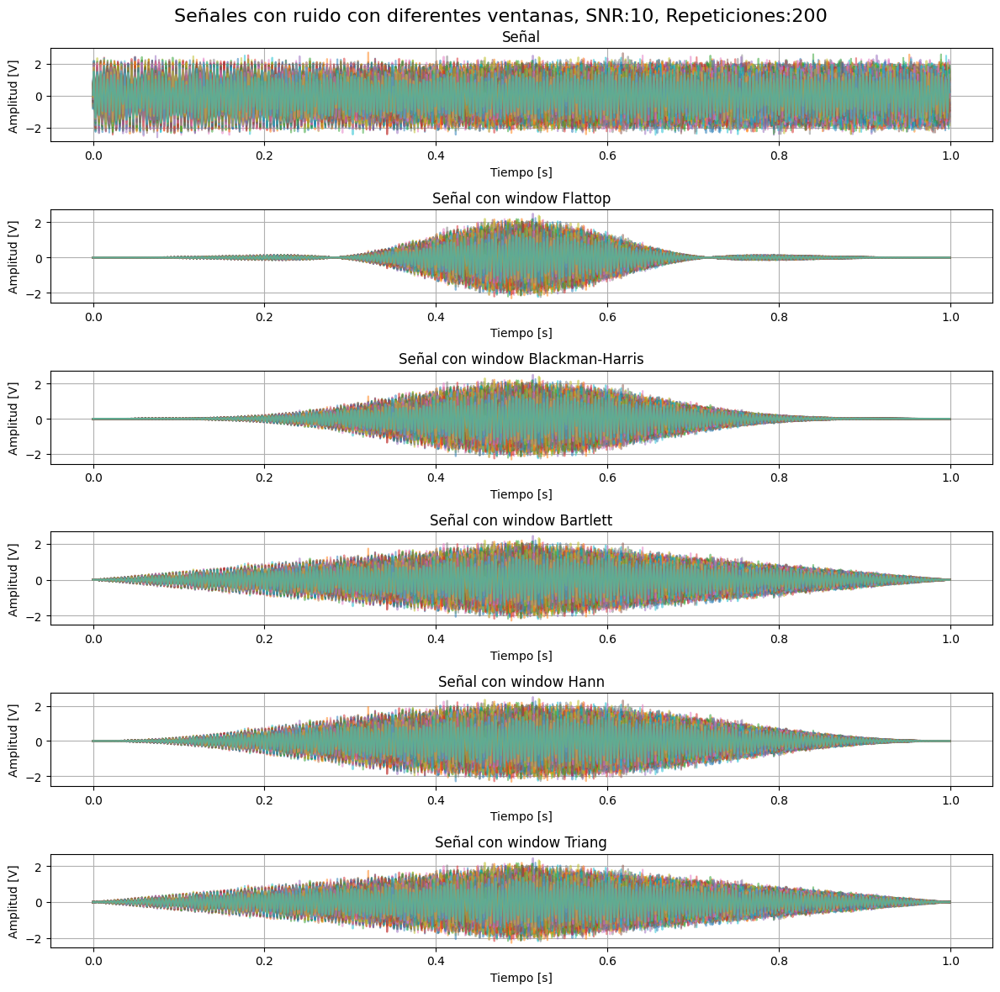

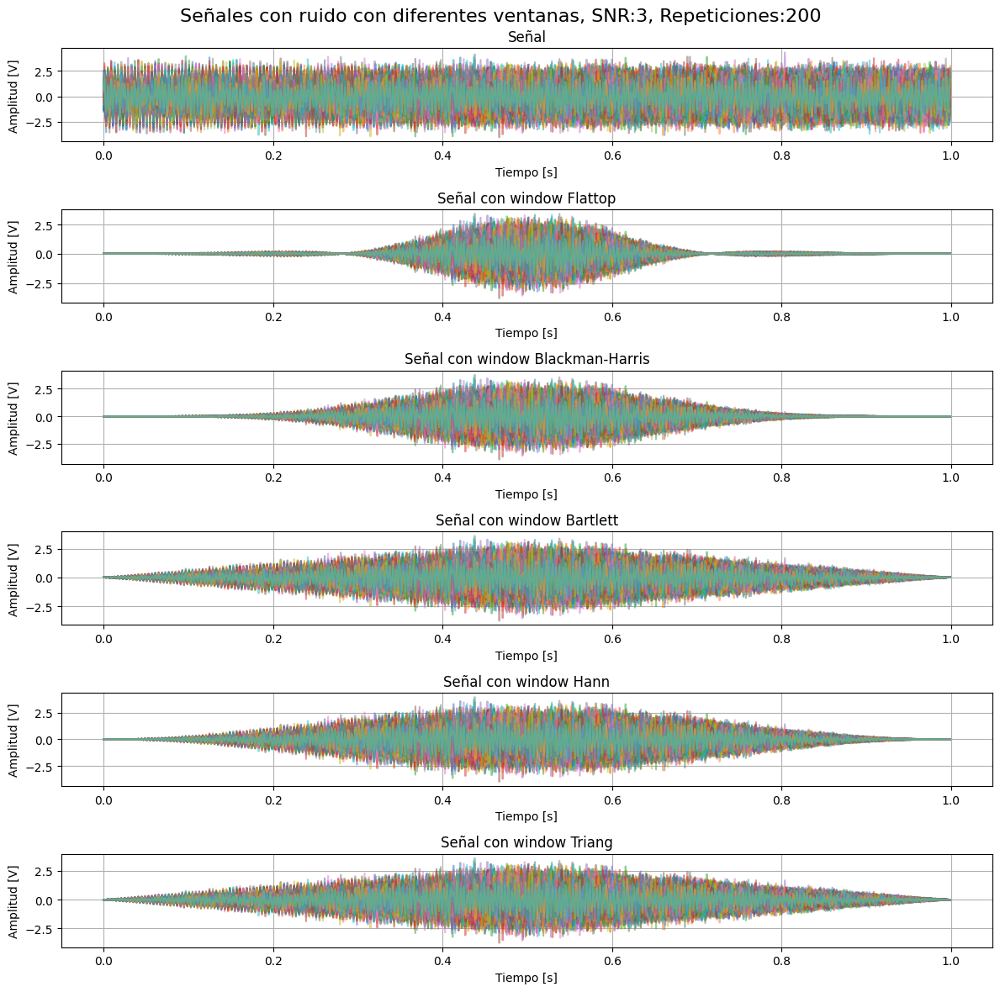

In [ ]:
plt.figure(figsize=(12, 12))
plt.subplot(w,1,1)
plot_temp(xk,t, repes, 'Señal', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,2)
plot_temp(xk_flattop,t, repes, 'Señal con window Flattop', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,3)
plot_temp(xk_blackh,t, repes, 'Señal con window Blackman-Harris', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,4)
plot_temp(xk_barlett,t, repes, 'Señal con window Bartlett', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,5)
plot_temp(xk_han,t, repes, 'Señal con window Hann', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,6)
plot_temp(xk_triang,t, repes, 'Señal con window Triang', 'Tiempo [s]', 'Amplitud [V]')
plt.suptitle(f'Señales con ruido con diferentes ventanas, SNR:{SNR}, Repeticiones:{repes}', fontsize=16)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 12))
plt.subplot(w,1,1)
plot_temp(xk_2,t, repes, 'Señal', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,2)
plot_temp(xk_flattop_2,t, repes, 'Señal con window Flattop', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,3)
plot_temp(xk_blackh_2,t, repes, 'Señal con window Blackman-Harris', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,4)
plot_temp(xk_barlett_2,t, repes, 'Señal con window Bartlett', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,5)
plot_temp(xk_han_2,t, repes, 'Señal con window Hann', 'Tiempo [s]', 'Amplitud [V]')
plt.subplot(w,1,6)
plot_temp(xk_triang_2,t, repes, 'Señal con window Triang', 'Tiempo [s]', 'Amplitud [V]')
plt.suptitle(f'Señales con ruido con diferentes ventanas, SNR:{SNR_2}, Repeticiones:{repes}', fontsize=16)
plt.tight_layout()
plt.show()


### SNR 10 Vs. SNR 3
Se observa que para el caso de SNR 10, el ruido es menor en comparacion con SNR 3. Esto se debe a que el SNR (Relacion Señal Ruido) representa el cociente entre la potencia de la señal y la potencia del ruido (descripto en la intro):

A mayor SNR (SNR=10):

La señal tiene mayor potencia en relación al ruido.

A menor SNR (SNR=3):

La señal tiene menor potencia en comparación al ruido.

PD: Los graficos estan escalados de manera diferente para una mejor visualizacion. A continuacion, se muestran ambos ruidos para una comparación directa.

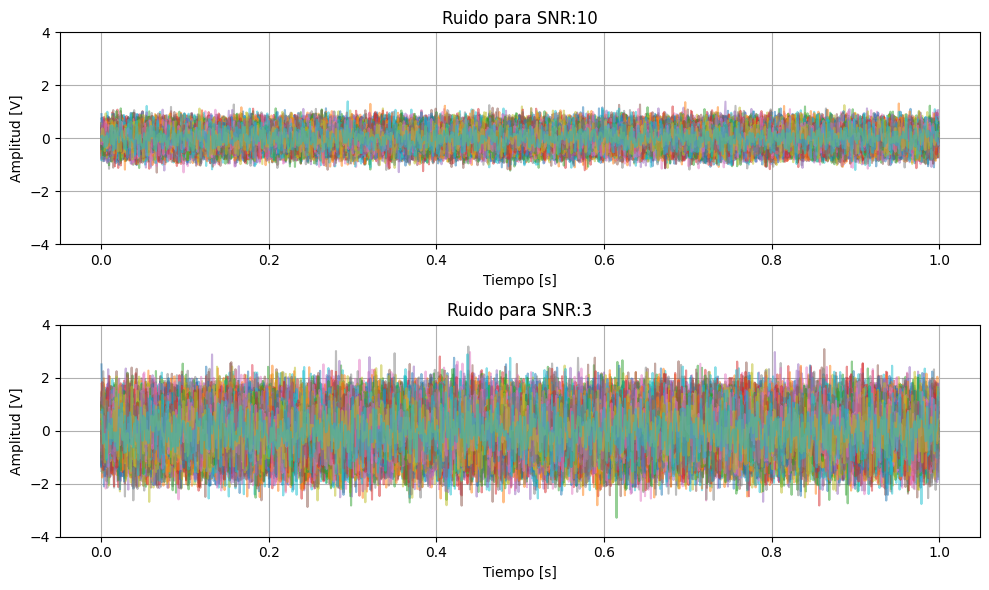

In [10]:
plt.figure(figsize=(10, 6))
plt.subplot(2,1,1)
plot_temp(nn,t, repes, f'Ruido para SNR:{SNR}', 'Tiempo [s]', 'Amplitud [V]')
plt.ylim(-4,4)
plt.subplot(2,1,2)
plot_temp(nn_2,t, repes, f'Ruido para SNR:{SNR_2}', 'Tiempo [s]', 'Amplitud [V]')
plt.ylim(-4,4)

plt.tight_layout()  


## Windows. ¿Para que sirven?
Lo explico en un ejemplo limpio y simple sin ruido.
Cuando se analiza una señal sinusoideal de 15 Hz con $f_s=1000$ y $N=1000$ (resolucion espectral: 1Hz), no se observa fuga espectral porque la frecuencia de la señal coincide exactamente con un bin de la DFT. En cambio, para una señal de 15.5 Hz, la frecuencia no cae en un bin entero, y la energía se reparte entre múltiples frecuencias. Esto genera **fuga espectral**, visible como una expansión del pico principal y la aparición de lóbulos secundarios (Se ve a continuación). Este efecto se debe al ventaneo implícito (Ventana rectangular) en la DFT y puede acentuarse o atenuarse según la ventana utilizada.
A continuacion dejo un mini ejemplo (es de unas clases atras) de las ventajas (y desventajas tambien) de utilizar una ventana.

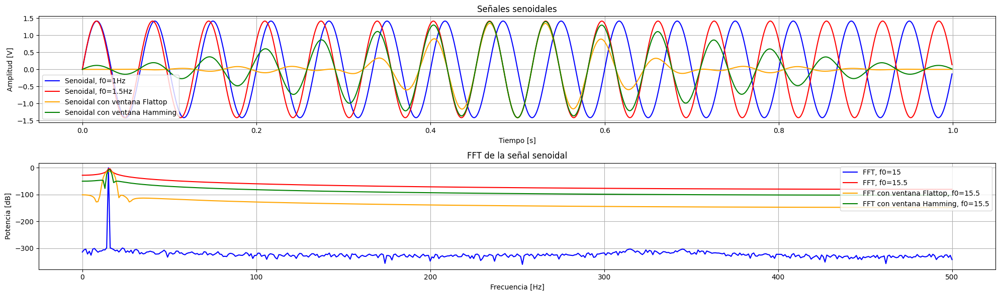

In [22]:
import Aps 
tt_pd, xx_pd = Aps.generador_sen(np.sqrt(2), 0, ff=15, ph=0, nn=N, fs=fs)
tt_pd_2, xx_pd_2 = Aps.generador_sen(np.sqrt(2), 0, ff=15.5, ph=0, nn=N, fs=fs)
plt.figure(figsize=(20, 6))
plt.subplot(2,1,1)
plt.plot(tt_pd, xx_pd, label=f'Senoidal, f0=1Hz', color='blue')
plt.plot(tt_pd, xx_pd_2, label=f'Senoidal, f0=1.5Hz', color='red')
plt.plot(tt_pd,xx_pd_2 *signal.windows.flattop(N, sym=True), label='Senoidal con ventana Flattop', color='orange')
plt.plot(tt_pd,xx_pd_2 *signal.windows.hamming(N, sym=True), label='Senoidal con ventana Hamming', color='green')
plt.title('Señales senoidales')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [V]')
plt.legend()
plt.grid()

plt.subplot(2,1,2)
ffx = np.linspace(0, (N-1)*df, N)   #eje frecuencial
bfrec = ffx <= fs/2 #es un booleano, m quedo solo con la mitad (redundante ambos lados del espectro)

ft_As = 1/N * np.fft.fft(xx_pd_2)
ft_As_1 = 1/N * np.fft.fft(xx_pd)
ft_As_w = 1/N * np.fft.fft(xx_pd_2 * signal.windows.flattop(N, sym=True))
ft_As_w_2 = 1/N * np.fft.fft(xx_pd_2 * signal.windows.hamming(N, sym=True))

plt.plot(ffx[bfrec], 10 * np.log10(2 * np.abs(ft_As_1[bfrec])**2), label='FFT, f0=15', color='blue')
plt.plot(ffx[bfrec], 10 * np.log10(2 * np.abs(ft_As[bfrec])**2), label='FFT, f0=15.5', color='red')
plt.plot(ffx[bfrec], 10 * np.log10(2 * np.abs(ft_As_w[bfrec])**2), label='FFT con ventana Flattop, f0=15.5', color='orange')
plt.plot(ffx[bfrec], 10 * np.log10(2 * np.abs(ft_As_w_2[bfrec])**2), label='FFT con ventana Hamming, f0=15.5', color='green')
plt.title('FFT de la señal senoidal')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Potencia [dB]')
plt.legend(loc = 'upper right')

plt.grid()
plt.tight_layout()
plt.show()

Cada ventana tiene sus pros y contras. Por ejemplo, la Flat Top sirve cuando nos importa medir bien la amplitud del pico, pero pierde mucha resolución (el pico se ensancha). La Hamming y la Hann son más equilibradas: bajan bastante la fuga (lóbulos laterales más bajos) sin ensanchar tanto el pico. La rectangular, que es la que usa la DFT por defecto, tiene el pico más fino, pero la mayor fuga. En resumen, elegir una ventana es decidir qué queremos priorizar: que el pico sea más fino (mejor resolución en frecuencia) o que no haya tanta fuga (mejor limpieza del espectro).

## Ploteo espectros

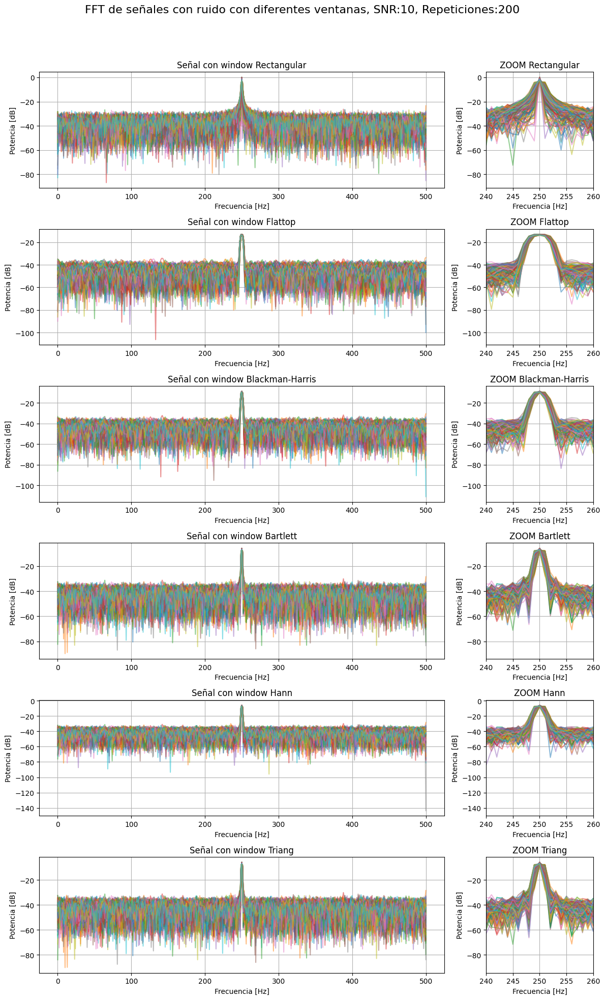

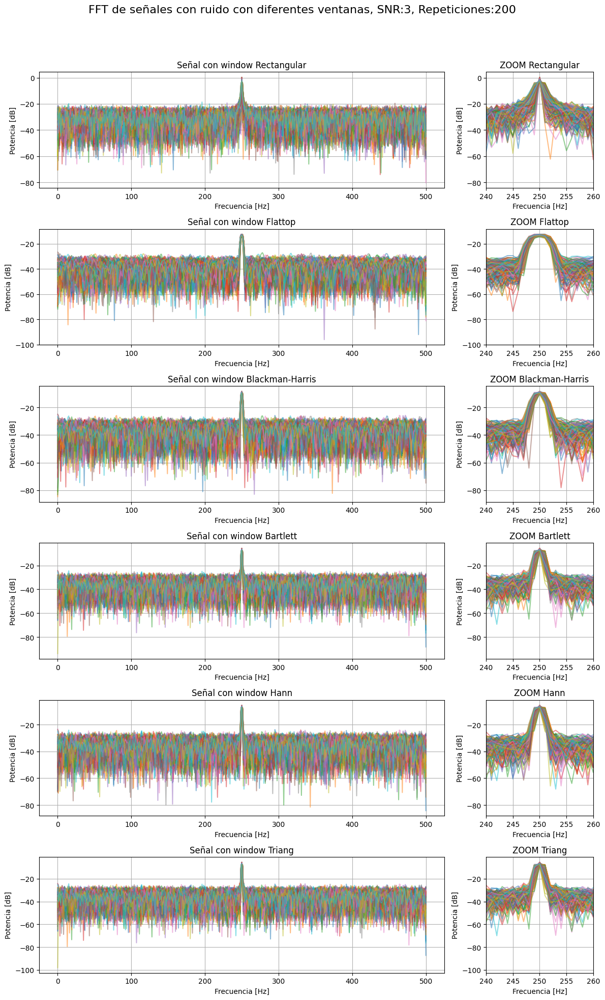

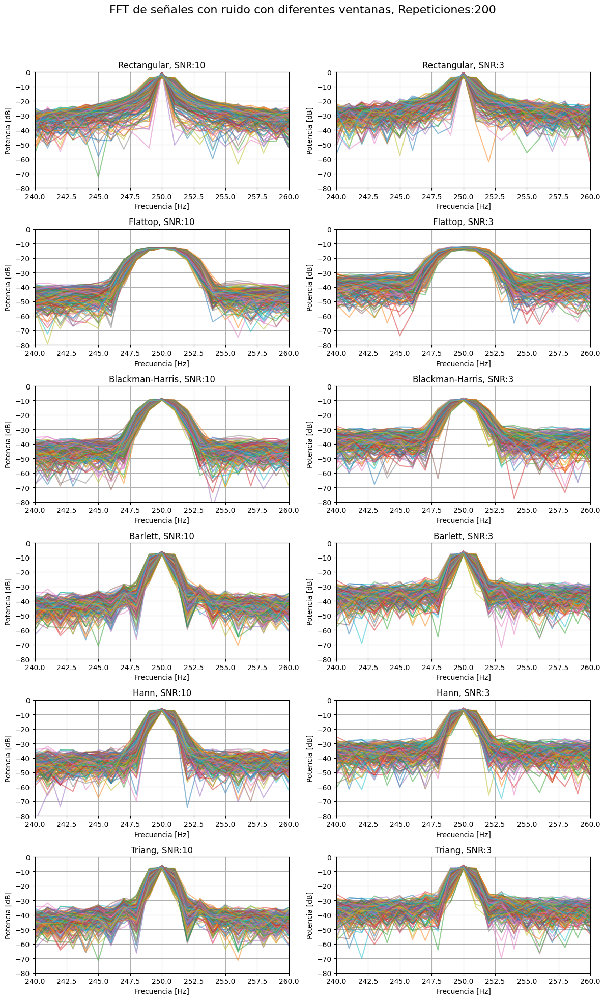

In [ ]:
plt.figure(figsize=(12, 20))

plt.subplot2grid((6, 4), (0, 0), colspan=3)
plot_freq(Xk_fft, ffx, repes, bfrec, 'Señal con window Rectangular', 'Frecuencia [Hz]', 'Potencia [dB]') 
plt.subplot2grid((6, 4), (0, 3))
plot_freq(Xk_fft, ffx, repes, bfrec, 'ZOOM Rectangular', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)

plt.subplot2grid((6, 4), (1, 0), colspan=3)
plot_freq(Xk_flattop_fft, ffx, repes, bfrec, 'Señal con window Flattop', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (1, 3))
plot_freq(Xk_flattop_fft, ffx, repes, bfrec, 'ZOOM Flattop', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)

plt.subplot2grid((6, 4), (2, 0), colspan=3)
plot_freq(Xk_blackh_fft, ffx, repes, bfrec, 'Señal con window Blackman-Harris', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (2, 3))
plot_freq(Xk_blackh_fft, ffx, repes, bfrec, 'ZOOM Blackman-Harris', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)

plt.subplot2grid((6, 4), (3, 0), colspan=3)
plot_freq(Xk_barlett_fft, ffx, repes, bfrec, 'Señal con window Bartlett', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (3, 3))
plot_freq(Xk_barlett_fft, ffx, repes, bfrec, 'ZOOM Bartlett', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)

plt.subplot2grid((6, 4), (4, 0), colspan=3)
plot_freq(Xk_han_fft, ffx, repes, bfrec, 'Señal con window Hann', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (4, 3))
plot_freq(Xk_han_fft, ffx, repes, bfrec, 'ZOOM Hann', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)

plt.subplot2grid((6, 4), (5, 0), colspan=3)
plot_freq(Xk_triang_fft, ffx, repes, bfrec, 'Señal con window Triang', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (5, 3))
plot_freq(Xk_triang_fft, ffx, repes, bfrec, 'ZOOM Triang', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)

plt.suptitle(f'FFT de señales con ruido con diferentes ventanas, SNR:{SNR}, Repeticiones:{repes}', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

#Ahora para SNR 3
plt.figure(figsize=(12, 20))
plt.subplot2grid((6, 4), (0, 0), colspan=3)
plot_freq(Xk_2_fft, ffx, repes, bfrec, 'Señal con window Rectangular', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (0, 3))
plot_freq(Xk_2_fft, ffx, repes, bfrec, 'ZOOM Rectangular', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.subplot2grid((6, 4), (1, 0), colspan=3)
plot_freq(Xk_flattop_2_fft, ffx, repes, bfrec, 'Señal con window Flattop', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (1, 3))
plot_freq(Xk_flattop_2_fft, ffx, repes, bfrec, 'ZOOM Flattop', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.subplot2grid((6, 4), (2, 0), colspan=3)
plot_freq(Xk_blackh_2_fft, ffx, repes, bfrec, 'Señal con window Blackman-Harris', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (2, 3))
plot_freq(Xk_blackh_2_fft, ffx, repes, bfrec, 'ZOOM Blackman-Harris', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.subplot2grid((6, 4), (3, 0), colspan=3)
plot_freq(Xk_barlett_2_fft, ffx, repes, bfrec, 'Señal con window Bartlett', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (3, 3))
plot_freq(Xk_barlett_2_fft, ffx, repes, bfrec, 'ZOOM Bartlett', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.subplot2grid((6, 4), (4, 0), colspan=3)
plot_freq(Xk_han_2_fft, ffx, repes, bfrec, 'Señal con window Hann', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (4, 3))
plot_freq(Xk_han_2_fft, ffx, repes, bfrec, 'ZOOM Hann', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.subplot2grid((6, 4), (5, 0), colspan=3)
plot_freq(Xk_triang_2_fft, ffx, repes, bfrec, 'Señal con window Triang', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.subplot2grid((6, 4), (5, 3))
plot_freq(Xk_triang_2_fft, ffx, repes, bfrec, 'ZOOM Triang', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.suptitle(f'FFT de señales con ruido con diferentes ventanas, SNR:{SNR_2}, Repeticiones:{repes}', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

plt.figure(figsize=(12, 20))
plt.subplot(6,2,1)
plot_freq(Xk_fft, ffx, repes, bfrec, f'Rectangular, SNR:{SNR}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,2)
plot_freq(Xk_2_fft, ffx, repes, bfrec, f'Rectangular, SNR:{SNR_2}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,3)
plot_freq(Xk_flattop_fft, ffx, repes, bfrec, f'Flattop, SNR:{SNR}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,4)
plot_freq(Xk_flattop_2_fft, ffx, repes, bfrec, f'Flattop, SNR:{SNR_2}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,5)
plot_freq(Xk_blackh_fft, ffx, repes, bfrec, f'Blackman-Harris, SNR:{SNR}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,6)
plot_freq(Xk_blackh_2_fft, ffx, repes, bfrec, f'Blackman-Harris, SNR:{SNR_2}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,7)
plot_freq(Xk_barlett_fft, ffx, repes, bfrec, f'Barlett, SNR:{SNR}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,8)
plot_freq(Xk_barlett_2_fft, ffx, repes, bfrec, f'Barlett, SNR:{SNR_2}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,9)
plot_freq(Xk_han_fft, ffx, repes, bfrec, f'Hann, SNR:{SNR}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,10)
plot_freq(Xk_han_2_fft, ffx, repes, bfrec, f'Hann, SNR:{SNR_2}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,11)
plot_freq(Xk_triang_fft, ffx, repes, bfrec, f'Triang, SNR:{SNR}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.subplot(6,2,12)
plot_freq(Xk_triang_2_fft, ffx, repes, bfrec, f'Triang, SNR:{SNR_2}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(N/4 - 10, N/4 + 10)
plt.ylim(-80, 0)
plt.suptitle(f'FFT de señales con ruido con diferentes ventanas, Repeticiones:{repes}', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Se aprecia bien en el ultimo que la ventana rectangular maximiza la precisión en la estimación de amplitud, ya que preserva el valor pico en la frecuencia N/2 (alrededor de 0 dB), mientras que otras ventanas atenúan este valor para reducir la fuga espectral.

Hipotesis de los estimadores:

Rectangular: menor sesgo en la estimación de amplitud (pico más alto), pero mayor varianza.

otras: menor varianza y fuga espectral, pero con mayor sesgo (amplitud subestimada).

## Estimador a

In [35]:
f0 = fs/4
a_implicita, a_implicita_media, a_implicita_var = estimador_a(Xk_fft, f0)
a_flattop, a_flattop_media, a_flattop_var = estimador_a(Xk_flattop_fft, f0)
a_blackh, a_blackh_media, a_blackh_var = estimador_a(Xk_blackh_fft, f0)
a_barlett, a_barlett_media, a_barlett_var = estimador_a(Xk_barlett_fft, f0)
a_han, a_han_media, a_han_var = estimador_a(Xk_han_fft, f0)
a_triang, a_triang_media, a_triang_var = estimador_a(Xk_triang_fft, f0)

a_2_implicita, a_2_implicita_media, a_2_implicita_var = estimador_a(Xk_2_fft, f0)
a_2_flattop, a_2_flattop_media, a_2_flattop_var = estimador_a(Xk_flattop_2_fft, f0)
a_2_blackh, a_2_blackh_media, a_2_blackh_var = estimador_a(Xk_blackh_2_fft, f0)
a_2_barlett, a_2_barlett_media, a_2_barlett_var = estimador_a(Xk_barlett_2_fft, f0)
a_2_han, a_2_han_media, a_2_han_var = estimador_a(Xk_han_2_fft, f0)
a_2_triang, a_2_triang_media, a_2_triang_var = estimador_a(Xk_triang_2_fft, f0)



Valor de a1 real:  1.4142135623730951


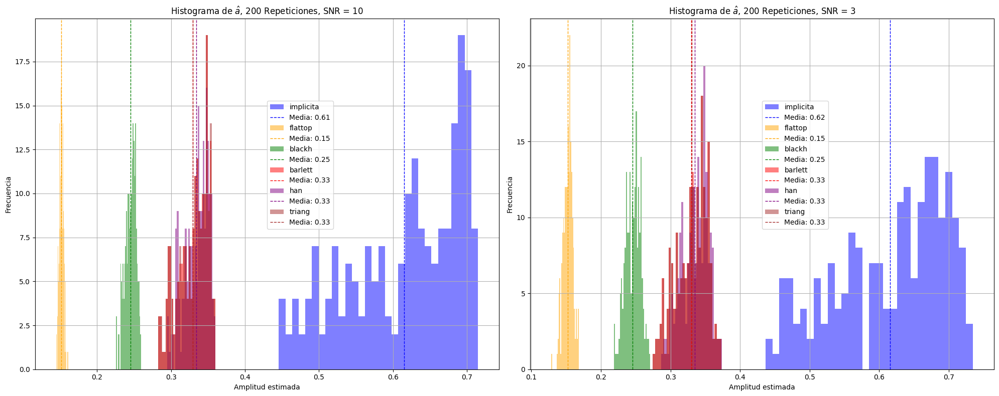

In [39]:

plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
plt.hist(a_implicita, color='blue', bins=30, alpha=0.5, label='implicita')
plt.axvline(a_implicita_media, color='blue', linestyle='dashed', linewidth=1, label=f'Media: {a_implicita_media:.2f}')
plt.hist(a_flattop, color='orange', bins=30, alpha=0.5, label='flattop')
plt.axvline(a_flattop_media, color='orange', linestyle='dashed', linewidth=1, label=f'Media: {a_flattop_media:.2f}')
plt.hist(a_blackh, color='green', bins=30, alpha=0.5, label='blackh')
plt.axvline(a_blackh_media, color='green', linestyle='dashed', linewidth=1, label=f'Media: {a_blackh_media:.2f}')
plt.hist(a_barlett, color='red', bins=30, alpha=0.5, label='barlett')
plt.axvline(a_barlett_media, color='red', linestyle='dashed', linewidth=1, label=f'Media: {a_barlett_media:.2f}')
plt.hist(a_han, color='purple', bins=30, alpha=0.5, label='han')
plt.axvline(a_han_media, color='purple', linestyle='dashed', linewidth=1, label=f'Media: {a_han_media:.2f}')
plt.hist(a_triang, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(a_triang_media, color='brown', linestyle='dashed', linewidth=1, label=f'Media: {a_triang_media:.2f}')
plt.title(f'Histograma de $\\hat{{a}}$, {repes} Repeticiones, SNR = {SNR}')
plt.xlabel("Amplitud estimada")
plt.ylabel("Frecuencia")
plt.legend(loc=(0.5, 0.4))
plt.grid()

plt.subplot(1,2,2)
plt.hist(a_2_implicita, color='blue', bins=30, alpha=0.5, label='implicita')
plt.axvline(a_2_implicita_media, color='blue', linestyle='dashed', linewidth=1, label=f'Media: {a_2_implicita_media:.2f}')
plt.hist(a_2_flattop, color='orange', bins=30, alpha=0.5, label='flattop')
plt.axvline(a_2_flattop_media, color='orange', linestyle='dashed', linewidth=1, label=f'Media: {a_2_flattop_media:.2f}')
plt.hist(a_2_blackh, color='green', bins=30, alpha=0.5, label='blackh')
plt.axvline(a_2_blackh_media, color='green', linestyle='dashed', linewidth=1, label=f'Media: {a_2_blackh_media:.2f}')
plt.hist(a_2_barlett, color='red', bins=30, alpha=0.5, label='barlett')
plt.axvline(a_2_barlett_media, color='red', linestyle='dashed', linewidth=1, label=f'Media: {a_2_barlett_media:.2f}')
plt.hist(a_2_han, color='purple', bins=30, alpha=0.5, label='han')
plt.axvline(a_2_han_media, color='purple', linestyle='dashed', linewidth=1, label=f'Media: {a_2_han_media:.2f}')
plt.hist(a_2_triang, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(a_2_triang_media, color='brown', linestyle='dashed', linewidth=1, label=f'Media: {a_2_triang_media:.2f}')
plt.title(f'Histograma de $\\hat{{a}}$, {repes} Repeticiones, SNR = {SNR_2}')
plt.xlabel("Amplitud estimada")
plt.ylabel("Frecuencia")
plt.legend(loc=(0.5, 0.4))
plt.grid()


plt.tight_layout()
print('Valor de a1 real: ', a1)
plt.show()


In [41]:
sesgo_implicita = a_implicita_media - a1
sesgo_flattop = a_flattop_media - a1
sesgo_blackh = a_blackh_media - a1
sesgo_barlett = a_barlett_media - a1
sesgo_han = a_han_media - a1
sesgo_triang = a_triang_media - a1

sesgo_2_implicita = a_2_implicita_media - a1
sesgo_2_flattop = a_2_flattop_media - a1
sesgo_2_blackh = a_2_blackh_media - a1
sesgo_2_barlett = a_2_barlett_media - a1
sesgo_2_han = a_2_han_media - a1
sesgo_2_triang = a_2_triang_media - a1

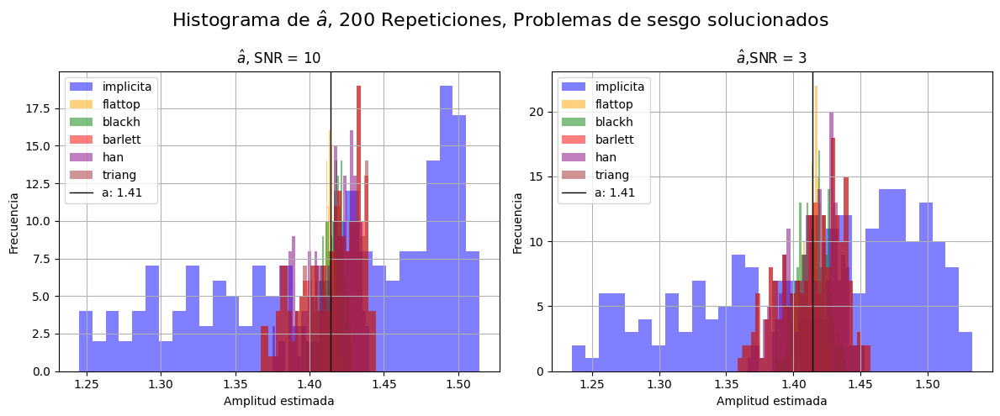

In [46]:
a_implicita_c = a_implicita - sesgo_implicita
a_flattop_c = a_flattop - sesgo_flattop
a_blackh_c = a_blackh - sesgo_blackh
a_barlett_c = a_barlett - sesgo_barlett
a_han_c = a_han - sesgo_han
a_triang_c = a_triang - sesgo_triang

a_2_implicita_c = a_2_implicita - sesgo_2_implicita
a_2_flattop_c = a_2_flattop - sesgo_2_flattop
a_2_blackh_c = a_2_blackh - sesgo_2_blackh
a_2_barlett_c = a_2_barlett - sesgo_2_barlett
a_2_han_c = a_2_han - sesgo_2_han
a_2_triang_c = a_2_triang - sesgo_2_triang


plt.figure(figsize=(12, 5))
plt.subplot(1,2,1)
plt.hist(a_implicita_c,color = 'blue', bins=30, alpha=0.5, label='implicita')
plt.hist(a_flattop_c, color='orange', bins=30, alpha=0.5, label='flattop')
plt.hist(a_blackh_c, color='green', bins=30, alpha=0.5, label='blackh')
plt.hist(a_barlett_c, color='red', bins=30, alpha=0.5, label='barlett')
plt.hist(a_han_c, color='purple', bins=30, alpha=0.5, label='han')
plt.hist(a_triang_c, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(a1, color='black', linestyle='-', linewidth=1, label=f'a: {a1:.2f}')
plt.title(f'$\\hat{{a}}$, SNR = {SNR} ')
plt.xlabel("Amplitud estimada")
plt.grid()
plt.ylabel("Frecuencia")
plt.legend()

plt.subplot(1,2,2)
plt.hist(a_2_implicita_c, color='blue', bins=30, alpha=0.5, label='implicita')
plt.hist(a_2_flattop_c, color='orange', bins=30, alpha=0.5, label='flattop')
plt.hist(a_2_blackh_c, color='green', bins=30, alpha=0.5, label='blackh')
plt.hist(a_2_barlett_c, color='red', bins=30, alpha=0.5, label='barlett')
plt.hist(a_2_han_c, color='purple', bins=30, alpha=0.5, label='han')
plt.hist(a_2_triang_c, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(a1, color='black', linestyle='-', linewidth=1, label=f'a: {a1:.2f}')
plt.title(f'$\\hat{{a}}$,SNR = {SNR_2} ')
plt.xlabel("Amplitud estimada")
plt.ylabel("Frecuencia")
plt.grid()
plt.legend()
plt.suptitle(f'Histograma de $\\hat{{a}}$, {repes} Repeticiones, Problemas de sesgo solucionados', fontsize=16)
plt.tight_layout()

plt.show()


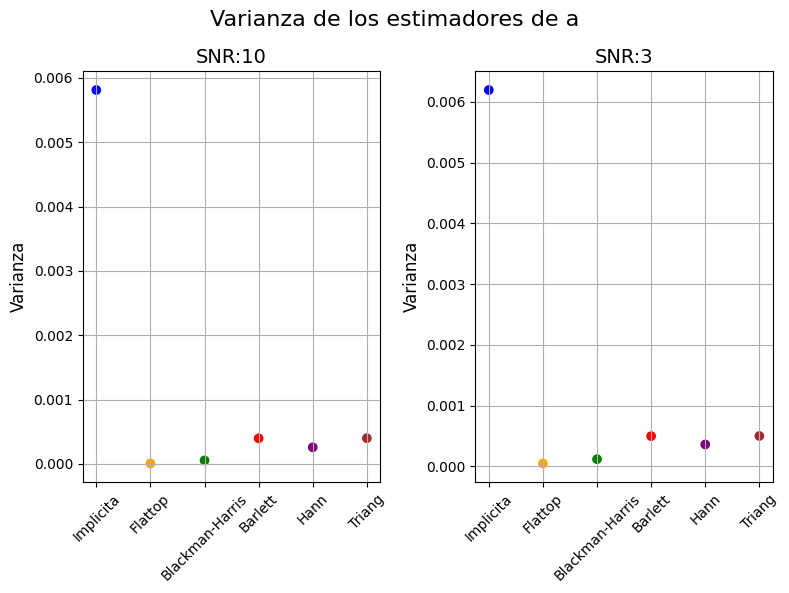

In [49]:
plt.figure(figsize=(8, 6))
a_ventanas = [a_implicita_media, a_flattop_media, a_blackh_media, a_barlett_media, a_han_media, a_triang_media]
a_2_ventanas = [a_2_implicita_media, a_2_flattop_media, a_2_blackh_media, a_2_barlett_media, a_2_han_media, a_2_triang_media]   
a_sesgos = [sesgo_implicita, sesgo_flattop, sesgo_blackh, sesgo_barlett, sesgo_han, sesgo_triang]
a_2_sesgos = [sesgo_2_implicita, sesgo_2_flattop, sesgo_2_blackh, sesgo_2_barlett, sesgo_2_han, sesgo_2_triang]
a_varianzas = [a_implicita_var, a_flattop_var, a_blackh_var, a_barlett_var, a_han_var, a_triang_var]
a_2_varianzas = [a_2_implicita_var, a_2_flattop_var, a_2_blackh_var, a_2_barlett_var, a_2_han_var, a_2_triang_var]
plt.subplot(1,2,1)
labels = ['Implicita', 'Flattop', 'Blackman-Harris', 'Barlett', 'Hann', 'Triang']
plt.scatter(range(len(a_varianzas)), a_varianzas, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
plt.xticks(range(len(a_varianzas)), labels, rotation=45, fontsize=10)
plt.title(f'SNR:{SNR}', fontsize=14)
plt.ylabel('Varianza', fontsize=12)
plt.grid(True)
plt.subplot(1,2,2)
plt.scatter(range(len(a_2_varianzas)), a_2_varianzas, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
plt.xticks(range(len(a_2_varianzas)), labels, rotation=45, fontsize=10)
plt.title(f'SNR:{SNR_2}', fontsize=14)
plt.ylabel('Varianza', fontsize=12)
plt.grid(True)
plt.suptitle('Varianza de los estimadores de a', fontsize=16)
plt.tight_layout()
plt.show()


### Conclusiones
En ambos casos el estimador de mejor sesgo (osea menor sesgo) fue la rectangular. Sin embargo, es el de mayor mayor varianza. Como bien mostre. el problema de sesgo tiene solucion. Mientras que la varianza no. 
Se observa como la flattop y Blackman-Harris tiene menor varianza. 

## Estimador w

In [51]:
w_implicita, w_implicita_media, w_implicita_var = estimador_w(Xk_fft, bfrec, df)
w_flattop, w_flattop_media, w_flattop_var = estimador_w(Xk_flattop_fft, bfrec, df)
w_blackh, w_blackh_media, w_blackh_var = estimador_w(Xk_blackh_fft, bfrec, df)
w_barlett, w_barlett_media, w_barlett_var = estimador_w(Xk_barlett_fft, bfrec, df)
w_han, w_han_media, w_han_var = estimador_w(Xk_han_fft, bfrec, df)
w_triang, w_triang_media, w_triang_var = estimador_w(Xk_triang_fft, bfrec, df)

w_2_implicita, w_2_implicita_media, w_2_implicita_var = estimador_w(Xk_2_fft, bfrec, df)
w_2_flattop, w_2_flattop_media, w_2_flattop_var = estimador_w(Xk_flattop_2_fft, bfrec, df)
w_2_blackh, w_2_blackh_media, w_2_blackh_var = estimador_w(Xk_blackh_2_fft, bfrec, df)
w_2_barlett, w_2_barlett_media, w_2_barlett_var = estimador_w(Xk_barlett_2_fft, bfrec, df)
w_2_han, w_2_han_media, w_2_han_var = estimador_w(Xk_han_2_fft, bfrec, df)
w_2_triang, w_2_triang_media, w_2_triang_var = estimador_w(Xk_triang_2_fft, bfrec, df)

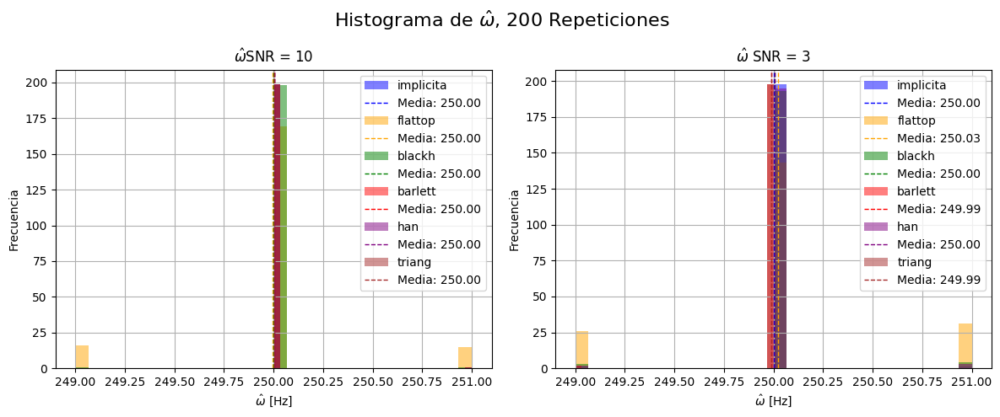

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1,2,1)
plt.hist(w_implicita,color = 'blue', bins=30, alpha=0.5, label='implicita')
plt.axvline(w_implicita_media, color='blue', linestyle='dashed', linewidth=1, label=f'Media: {w_implicita_media:.2f}')
plt.hist(w_flattop, color='orange', bins=30, alpha=0.5, label='flattop')
plt.axvline(w_flattop_media, color='orange', linestyle='dashed', linewidth=1, label=f'Media: {w_flattop_media:.2f}')
plt.hist(w_blackh, color='green', bins=30, alpha=0.5, label='blackh')
plt.axvline(w_blackh_media, color='green', linestyle='dashed', linewidth=1, label=f'Media: {w_blackh_media:.2f}')
plt.hist(w_barlett, color='red', bins=30, alpha=0.5, label='barlett')
plt.axvline(w_barlett_media, color='red', linestyle='dashed', linewidth=1, label=f'Media: {w_barlett_media:.2f}')
plt.hist(w_han, color='purple', bins=30, alpha=0.5, label='han')
plt.axvline(w_han_media, color='purple', linestyle='dashed', linewidth=1, label=f'Media: {w_han_media:.2f}')
plt.hist(w_triang, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(w_triang_media, color='brown', linestyle='dashed', linewidth=1, label=f'Media: {w_triang_media:.2f}')
plt.legend()
plt.xlabel("$\\hat{{\omega}}$ [Hz]")
plt.ylabel("Frecuencia")
plt.title(f'$\\hat{{\omega}}, $SNR = {SNR}')
plt.grid()

plt.subplot(1,2,2)
plt.hist(w_2_implicita, color='blue', bins=30, alpha=0.5, label='implicita')
plt.axvline(w_2_implicita_media, color='blue', linestyle='dashed', linewidth=1, label=f'Media: {w_2_implicita_media:.2f}')
plt.hist(w_2_flattop, color='orange', bins=30, alpha=0.5, label='flattop')
plt.axvline(w_2_flattop_media, color='orange', linestyle='dashed', linewidth=1, label=f'Media: {w_2_flattop_media:.2f}')
plt.hist(w_2_blackh, color='green', bins=30, alpha=0.5, label='blackh')
plt.axvline(w_2_blackh_media, color='green', linestyle='dashed', linewidth=1, label=f'Media: {w_2_blackh_media:.2f}')
plt.hist(w_2_barlett, color='red', bins=30, alpha=0.5, label='barlett')
plt.axvline(w_2_barlett_media, color='red', linestyle='dashed', linewidth=1, label=f'Media: {w_2_barlett_media:.2f}')
plt.hist(w_2_han, color='purple', bins=30, alpha=0.5, label='han')
plt.axvline(w_2_han_media, color='purple', linestyle='dashed', linewidth=1, label=f'Media: {w_2_han_media:.2f}')
plt.hist(w_2_triang, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(w_2_triang_media, color='brown', linestyle='dashed', linewidth=1, label=f'Media: {w_2_triang_media:.2f}')
plt.legend()
plt.xlabel("$\\hat{{\omega}}$ [Hz]")
plt.ylabel("Frecuencia")
plt.title(f'$\\hat{{\omega}}$ SNR = {SNR_2}')
plt.grid()
plt.suptitle(f'Histograma de $\\hat{{\omega}}$, {repes} Repeticiones', fontsize=16)
plt.tight_layout()
plt.show()

Observando el grafico, no me parece muy buena decision elejir un estimador bajo estas circunstancias. La resolucion espectral que tengo no me permite hacer un buen analisis. En el Bonus hago Zero- Padding

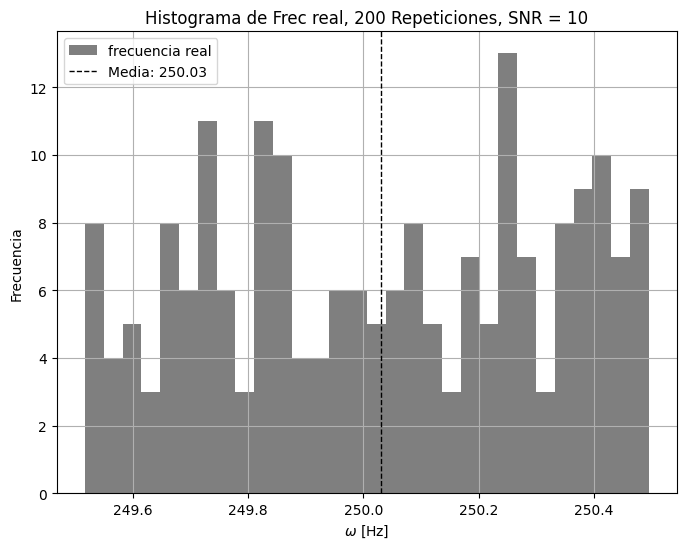

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(np.ravel(ff),color = 'black', bins=30, alpha=0.5, label='frecuencia real')
plt.axvline(ff.mean(), color='black', linestyle='dashed', linewidth=1, label=f'Media: {ff.mean():.2f}')
plt.xlabel("$\omega$ [Hz]")
plt.ylabel("Frecuencia")
plt.title(f'Histograma de Frec real, {repes} Repeticiones, SNR = {SNR}')
plt.grid()
plt.legend()
plt.show()

De la consigna interpreto que la frecuencia que quiero estimar es la que tiene sumada el ruido. No la constante. Por lo tanto tengo un vector de "Valores reales de frecuencia", decidi calcularle la media y trabajar a este valor como el "Valor real" a apartir del cual voy a calcular los sesgos. 

In [54]:
sesgo_w_implicita = w_implicita_media - ff.mean()
sesgo_w_flattop = w_flattop_media - ff.mean()
sesgo_w_blackh = w_blackh_media - ff.mean()
sesgo_w_barlett = w_barlett_media - ff.mean()
sesgo_w_han = w_han_media - ff.mean()
sesgo_w_triang = w_triang_media - ff.mean()

sesgo_2_w_implicita = w_2_implicita_media - ff.mean()
sesgo_2_w_flattop = w_2_flattop_media - ff.mean()
sesgo_2_w_blackh = w_2_blackh_media - ff.mean()
sesgo_2_w_barlett = w_2_barlett_media - ff.mean()
sesgo_2_w_han = w_2_han_media - ff.mean()
sesgo_2_w_triang = w_2_triang_media - ff.mean()


[]

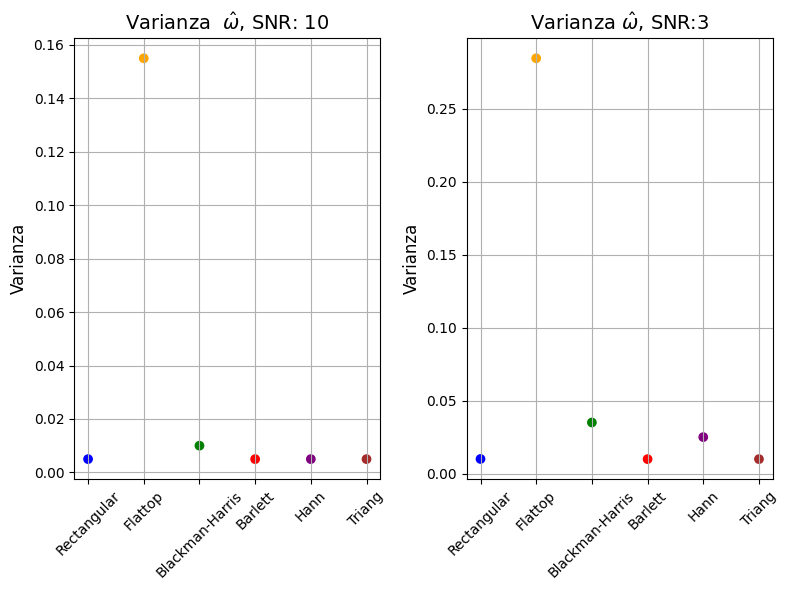

In [56]:
plt.figure(figsize=(8, 6))
w_ventanas = [w_implicita_media, w_flattop_media, w_blackh_media, w_barlett_media, w_han_media, w_triang_media]
w_2_ventanas = [w_2_implicita_media, w_2_flattop_media, w_2_blackh_media, w_2_barlett_media, w_2_han_media, w_2_triang_media]
w_sesgos = [sesgo_w_implicita, sesgo_w_flattop, sesgo_w_blackh, sesgo_w_barlett, sesgo_w_han, sesgo_w_triang]
w_2_sesgos = [sesgo_2_w_implicita, sesgo_2_w_flattop, sesgo_2_w_blackh, sesgo_2_w_barlett, sesgo_2_w_han, sesgo_2_w_triang]
w_varianzas = [w_implicita_var, w_flattop_var, w_blackh_var, w_barlett_var, w_han_var, w_triang_var]
w_2_varianzas = [w_2_implicita_var, w_2_flattop_var, w_2_blackh_var, w_2_barlett_var, w_2_han_var, w_2_triang_var]
plt.subplot(1,2,1)
labels = ['Rectangular', 'Flattop', 'Blackman-Harris', 'Barlett', 'Hann', 'Triang']
plt.scatter(range(len(w_varianzas)), w_varianzas, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
plt.xticks(range(len(w_varianzas)), labels, rotation=45, fontsize=10)
plt.title(f'Varianza  $\\hat{{\omega}}$, SNR: {SNR}', fontsize=14)
plt.ylabel('Varianza', fontsize=12)
plt.grid(True)

plt.subplot(1,2,2)
plt.scatter(range(len(w_2_varianzas)), w_2_varianzas, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
plt.xticks(range(len(w_2_varianzas)), labels, rotation=45, fontsize=10)
plt.title(f'Varianza $\\hat{{\omega}}$, SNR:{SNR_2}', fontsize=14)
plt.ylabel('Varianza', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.plot()

In [61]:
from prettytable import PrettyTable
table = PrettyTable()
table.field_names = ['Window', 'â', 'â - a', 'Var(â)', 'ω̂', 'ω̂ - ω', 'Var(ω̂)']

for i in range(len(labels)):
    table.add_row([
    labels[i], 
    f"{a_ventanas[i]:.3f}", 
    f"{a_sesgos[i]:.3f}", 
    f"{a_varianzas[i]:.5f}", 
    f"{w_ventanas[i]:.3f}", 
    f"{w_sesgos[i]:.3f}", 
    f"{w_varianzas[i]:.5f}"
])
print(f'-----------------------------------')
print(f'-----------   RESUMEN   -----------')
print(f'-----------------------------------')

print(f'SNR: {SNR}')
print(f'a real: {a1:.3f}')
print(f'ω real:{ff.mean():.2f}')
print(table)

table_2 = PrettyTable()
table_2.field_names = ['Window', 'â', 'â - a', 'Var(â)', 'ω̂', 'ω̂ - ω', 'Var(ω̂)']
for i in range(len(labels)):
    table_2.add_row([
    labels[i], 
    f"{a_2_ventanas[i]:.3f}", 
    f"{a_2_sesgos[i]:.3f}", 
    f"{a_2_varianzas[i]:.5f}", 
    f"{w_2_ventanas[i]:.3f}", 
    f"{w_2_sesgos[i]:.3f}", 
    f"{w_2_varianzas[i]:.5f}"
])
print(f'SNR: {SNR_2}')
print(f'a real: {a1:.3f}')
print(f'ω real:{ff.mean():.2f}')
print(table_2)

-----------------------------------
-----------   RESUMEN   -----------
-----------------------------------
SNR: 10
a real: 1.414
ω real:250.03
+-----------------+-------+--------+---------+---------+--------+---------+
|      Window     |   â   | â - a  |  Var(â) |    ω̂    | ω̂ - ω  |  Var(ω̂) |
+-----------------+-------+--------+---------+---------+--------+---------+
|   Rectangular   | 0.615 | -0.799 | 0.00581 | 250.005 | -0.026 | 0.00497 |
|     Flattop     | 0.152 | -1.262 | 0.00001 | 249.995 | -0.036 | 0.15497 |
| Blackman-Harris | 0.245 | -1.169 | 0.00006 | 250.000 | -0.031 | 0.01000 |
|     Barlett     | 0.329 | -1.085 | 0.00040 | 250.005 | -0.026 | 0.00497 |
|       Hann      | 0.334 | -1.080 | 0.00026 | 250.005 | -0.026 | 0.00497 |
|      Triang     | 0.330 | -1.084 | 0.00040 | 250.005 | -0.026 | 0.00497 |
+-----------------+-------+--------+---------+---------+--------+---------+
SNR: 3
a real: 1.414
ω real:250.03
+-----------------+-------+--------+---------+---------+--

Si bien la implicita es la que presenta una menor varianza, no es conveniente estimar la frecuencia cuando tengo una resolucion espectral mala. Voy a mejorar la resolucion espectral (haciendo cero-padding). 

## Zero - Padding ¿Para que sirve?

Ventajas: 
- la FFT genera mas puntos entre las frecuencias originales lo que suaviza el espectro (El cero-padding equivale a convolucionar el espectro original con una sinc. Esto genera una curva suave entre los bins originales.)
- Los ceros no agregan informacion nueva, solo permiten distinguir componentes cercanos en frecuencia
A continuacion muestro es el espectro luego de hacer zero - padding. Los graficos que vienen a continuacion los hice para ver como interpola la sinc y como se ve para distintas versiones. 

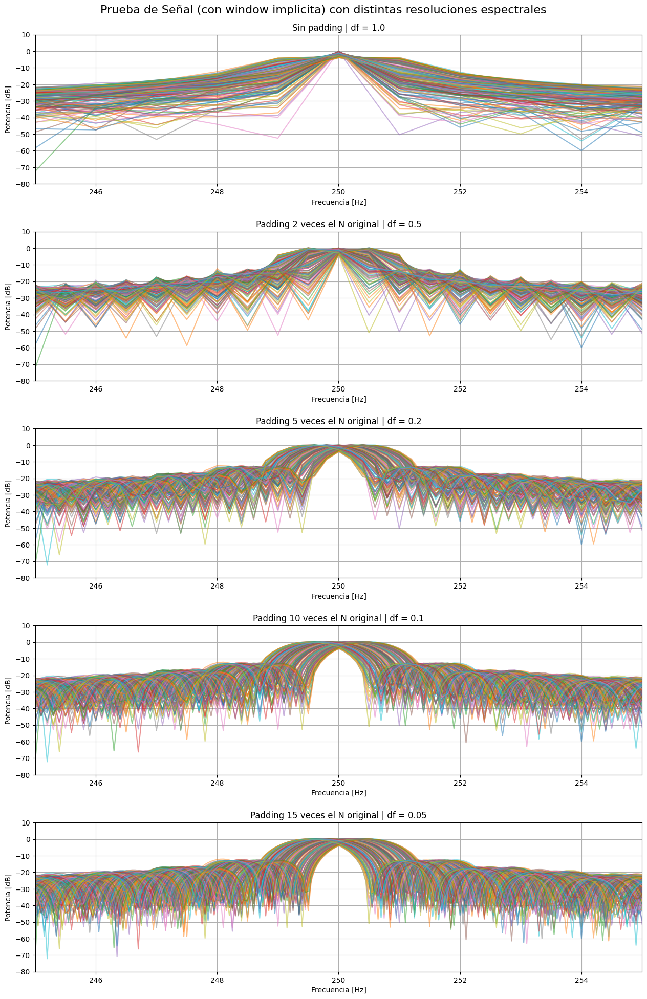

In [ ]:
N_pad_1 = N * 2
N_pad_2 = N * 5
N_pad_3 = N * 10
N_pad_4 = N * 20

Xk_fft_pad, ffx_pad, bfrec_pad, df_pad = gen_fft(xk,fs=fs, cte=N_pad_1)
Xk_fft_pad_2, ffx_pad_2, bfrec_pad_2, df_pad_2 = gen_fft(xk,fs=fs, cte=N_pad_2)
Xk_fft_pad_3, ffx_pad_3, bfrec_pad_3, df_pad_3 = gen_fft(xk,fs=fs, cte=N_pad_3)
Xk_fft_pad_4, ffx_pad_4, bfrec_pad_4, df_pad_4 = gen_fft(xk,fs=fs, cte=N_pad_4)

plt.figure(figsize=(13, 20))
plt.subplot(5,1,1) #sin padding
plot_freq(Xk_fft, ffx, repes, bfrec, f'Sin padding | df = {df}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(fs/4 - 5, fs/4 + 5)
plt.ylim(-80, 10)
plt.subplot(5,1,2) #padding 2 veces el N original
plot_freq(Xk_fft_pad, ffx_pad, repes, bfrec_pad, f'Padding 2 veces el N original | df = {df_pad}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(fs/4 - 5, fs/4 + 5)
plt.ylim(-80, 10)
plt.subplot(5,1,3) #padding 5 veces el N original
plot_freq(Xk_fft_pad_2, ffx_pad_2, repes, bfrec_pad_2, f'Padding 5 veces el N original | df = {df_pad_2}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(fs/4 - 5, fs/4 + 5)
plt.ylim(-80, 10)
plt.subplot(5,1,4) #padding 15 veces el N original
plot_freq(Xk_fft_pad_3, ffx_pad_3, repes, bfrec_pad_3, f'Padding 10 veces el N original | df = {df_pad_3}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(fs/4 - 5, fs/4 + 5)
plt.ylim(-80, 10)
plt.subplot(5,1,5) #padding 30 veces el N original
plot_freq(Xk_fft_pad_4, ffx_pad_4, repes, bfrec_pad_4, f'Padding 20 veces el N original | df = {df_pad_4}', 'Frecuencia [Hz]', 'Potencia [dB]')
plt.xlim(fs/4 - 5, fs/4 + 5)
plt.ylim(-80, 10)

plt.suptitle('Prueba de Señal (con window implicita) con distintas resoluciones espectrales', fontsize=16)
plt.tight_layout( pad=2.0)
plt.show()



Se ve re bien como al pasar de df=1 a df=0.5 ahora 2 bins cada 1 "antiguo" bin. Antes de 250 a 252 tenia 3 bins. ahora tengo 5. (incluyendo bordes)

Me voy a quedar con el padding tal que ahora tengo 20*N puntos. Osea que paso de tener N=1000 muestras de cada señal, relleno con ceros tal que obtengo 10*N 

Ahora voy a Analizar el efecto del zero-padding para el estimador  Ω^1. Voy a hcer zero-padding a las 6 ventanas tanto para SNR = 10 como para SNR = 2

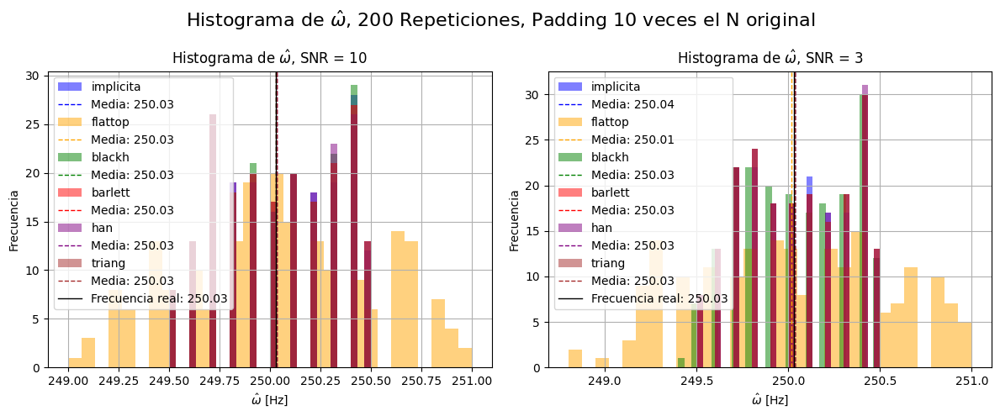

In [69]:

Xk_fft_pad_implicita, ffx_pad, bfrec_pad, df_pad = gen_fft(xk,fs=fs, cte=N_pad_3)
Xk_flattop_fft_pad, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_flattop,fs=fs, cte=N_pad_3)
Xk_blackh_fft_pad, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_blackh,fs=fs, cte=N_pad_3)
Xk_barlett_fft_pad, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_barlett,fs=fs, cte=N_pad_3)
Xk_han_fft_pad, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_han,fs=fs, cte=N_pad_3)
Xk_triang_fft_pad, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_triang,fs=fs, cte=N_pad_3)


Xk_fft_pad_implicita_2, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_2,fs=fs, cte=N_pad_3)
Xk_flattop_fft_pad_2, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_flattop_2,fs=fs, cte=N_pad_3)
Xk_blackh_fft_pad_2, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_blackh_2,fs=fs, cte=N_pad_3)
Xk_barlett_fft_pad_2, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_barlett_2,fs=fs, cte=N_pad_3)
Xk_han_fft_pad_2, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_han_2,fs=fs, cte=N_pad_3)
Xk_triang_fft_pad_2, ffx_pad, bfrec_pad, df_pad = gen_fft(xk_triang_2,fs=fs, cte=N_pad_3)



w_implicita_pad, w_implicita_pad_media, w_implicita_pad_var = estimador_w(Xk_fft_pad_implicita, bfrec_pad, df_pad)
w_flattop_pad, w_flattop_pad_media, w_flattop_pad_var = estimador_w(Xk_flattop_fft_pad, bfrec_pad, df_pad)
w_blackh_pad, w_blackh_pad_media, w_blackh_pad_var = estimador_w(Xk_blackh_fft_pad, bfrec_pad, df_pad)
w_barlett_pad, w_barlett_pad_media, w_barlett_pad_var = estimador_w(Xk_barlett_fft_pad, bfrec_pad, df_pad)
w_han_pad, w_han_pad_media, w_han_pad_var = estimador_w(Xk_han_fft_pad, bfrec_pad, df_pad)
w_triang_pad, w_triang_pad_media, w_triang_pad_var = estimador_w(Xk_triang_fft_pad, bfrec_pad, df_pad)

w_2_implicita_pad, w_2_implicita_pad_media, w_2_implicita_pad_var = estimador_w(Xk_fft_pad_implicita_2, bfrec_pad, df_pad)
w_2_flattop_pad, w_2_flattop_pad_media, w_2_flattop_pad_var = estimador_w(Xk_flattop_fft_pad_2, bfrec_pad, df_pad)
w_2_blackh_pad, w_2_blackh_pad_media, w_2_blackh_pad_var = estimador_w(Xk_blackh_fft_pad_2, bfrec_pad, df_pad)
w_2_barlett_pad, w_2_barlett_pad_media, w_2_barlett_pad_var = estimador_w(Xk_barlett_fft_pad_2, bfrec_pad, df_pad)
w_2_han_pad, w_2_han_pad_media, w_2_han_pad_var = estimador_w(Xk_han_fft_pad_2, bfrec_pad, df_pad)
w_2_triang_pad, w_2_triang_pad_media, w_2_triang_pad_var = estimador_w(Xk_triang_fft_pad_2, bfrec_pad, df_pad)


plt.figure(figsize=(12, 5))
plt.subplot(1,2,1)
plt.hist(w_implicita_pad,color = 'blue', bins=30, alpha=0.5, label='implicita')
plt.axvline(w_implicita_pad_media, color='blue', linestyle='dashed', linewidth=1, label=f'Media: {w_implicita_pad_media:.2f}')
plt.hist(w_flattop_pad, color='orange', bins=30, alpha=0.5, label='flattop')
plt.axvline(w_flattop_pad_media, color='orange', linestyle='dashed', linewidth=1, label=f'Media: {w_flattop_pad_media:.2f}')
plt.hist(w_blackh_pad, color='green', bins=30, alpha=0.5, label='blackh')
plt.axvline(w_blackh_pad_media, color='green', linestyle='dashed', linewidth=1, label=f'Media: {w_blackh_pad_media:.2f}')
plt.hist(w_barlett_pad, color='red', bins=30, alpha=0.5, label='barlett')
plt.axvline(w_barlett_pad_media, color='red', linestyle='dashed', linewidth=1, label=f'Media: {w_barlett_pad_media:.2f}')
plt.hist(w_han_pad, color='purple', bins=30, alpha=0.5, label='han')
plt.axvline(w_han_pad_media, color='purple', linestyle='dashed', linewidth=1, label=f'Media: {w_han_pad_media:.2f}')
plt.hist(w_triang_pad, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(w_triang_pad_media, color='brown', linestyle='dashed', linewidth=1, label=f'Media: {w_triang_pad_media:.2f}')

plt.axvline(ff.mean(), color='black', linestyle='-', linewidth=1, label=f'Frecuencia real: {ff.mean():.2f}')
plt.legend(loc = 'upper left')
plt.xlabel("$\\hat{{\omega}}$ [Hz]")
plt.ylabel("Frecuencia")
plt.title(f'Histograma de $\\hat{{\omega}}$, SNR = {SNR}')
plt.grid()


plt.subplot(1,2,2)
plt.hist(w_2_implicita_pad, color='blue', bins=30, alpha=0.5, label='implicita')
plt.axvline(w_2_implicita_pad_media, color='blue', linestyle='dashed', linewidth=1, label=f'Media: {w_2_implicita_pad_media:.2f}')
plt.hist(w_2_flattop_pad, color='orange', bins=30, alpha=0.5, label='flattop')
plt.axvline(w_2_flattop_pad_media, color='orange', linestyle='dashed', linewidth=1, label=f'Media: {w_2_flattop_pad_media:.2f}')
plt.hist(w_2_blackh_pad, color='green', bins=30, alpha=0.5, label='blackh')
plt.axvline(w_2_blackh_pad_media, color='green', linestyle='dashed', linewidth=1, label=f'Media: {w_2_blackh_pad_media:.2f}')
plt.hist(w_2_barlett_pad, color='red', bins=30, alpha=0.5, label='barlett')
plt.axvline(w_2_barlett_pad_media, color='red', linestyle='dashed', linewidth=1, label=f'Media: {w_2_barlett_pad_media:.2f}')
plt.hist(w_2_han_pad, color='purple', bins=30, alpha=0.5, label='han')
plt.axvline(w_2_han_pad_media, color='purple', linestyle='dashed', linewidth=1, label=f'Media: {w_2_han_pad_media:.2f}')
plt.hist(w_2_triang_pad, color='brown', bins=30, alpha=0.5, label='triang')
plt.axvline(w_2_triang_pad_media, color='brown', linestyle='dashed', linewidth=1, label=f'Media: {w_2_triang_pad_media:.2f}')
plt.axvline(ff.mean(), color='black', linestyle='-', linewidth=1, label=f'Frecuencia real: {ff.mean():.2f}')
plt.legend()
plt.xlabel("$\\hat{{\omega}}$ [Hz]")
plt.ylabel("Frecuencia")
plt.title(f'Histograma de $\\hat{{\omega}}$, SNR = {SNR_2}')
plt.grid()

plt.suptitle(f'Histograma de $\\hat{{\omega}}$, {repes} Repeticiones, Padding 10 veces el N original', fontsize=16)
plt.tight_layout()
plt.show()


In [71]:
sesgo_w_pad_implicita = w_implicita_pad_media - ff.mean()
sesgo_w_pad_flattop = w_flattop_pad_media - ff.mean()
sesgo_w_pad_blackh = w_blackh_pad_media - ff.mean()
sesgo_w_pad_barlett = w_barlett_pad_media - ff.mean()
sesgo_w_pad_han = w_han_pad_media - ff.mean()
sesgo_w_pad_triang = w_triang_pad_media - ff.mean()

sesgo_2_w_pad_implicita = w_2_implicita_pad_media - ff.mean()
sesgo_2_w_pad_flattop = w_2_flattop_pad_media - ff.mean()
sesgo_2_w_pad_blackh = w_2_blackh_pad_media - ff.mean()
sesgo_2_w_pad_barlett = w_2_barlett_pad_media - ff.mean()
sesgo_2_w_pad_han = w_2_han_pad_media - ff.mean()
sesgo_2_w_pad_triang = w_2_triang_pad_media - ff.mean()

Los sesgos quedaron mínimos. Considero que mis 6 estimadores son buenos. El mejor en cuanto a sesgo sería barlett.

[]

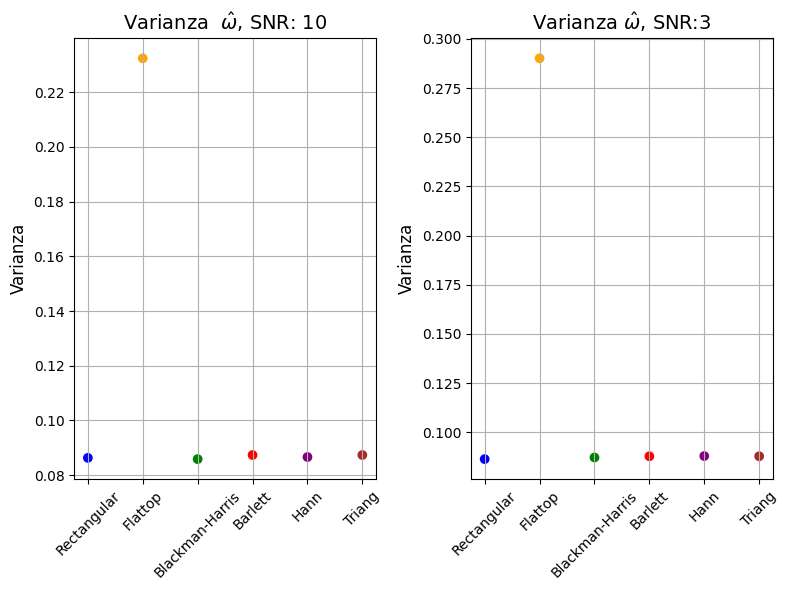

In [72]:
# plot varincas
plt.figure(figsize=(8, 6))
w_ventanas_pad = [w_implicita_pad_media, w_flattop_pad_media, w_blackh_pad_media, w_barlett_pad_media, w_han_pad_media, w_triang_pad_media]
w_2_ventanas_pad = [w_2_implicita_pad_media, w_2_flattop_pad_media, w_2_blackh_pad_media, w_2_barlett_pad_media, w_2_han_pad_media, w_2_triang_pad_media]
w_sesgos_pad = [sesgo_w_pad_implicita, sesgo_w_pad_flattop, sesgo_w_pad_blackh, sesgo_w_pad_barlett, sesgo_w_pad_han, sesgo_w_pad_triang]
w_2_sesgos_pad = [sesgo_2_w_pad_implicita, sesgo_2_w_pad_flattop, sesgo_2_w_pad_blackh, sesgo_2_w_pad_barlett, sesgo_2_w_pad_han, sesgo_2_w_pad_triang]
w_varianzas_pad = [w_implicita_pad_var, w_flattop_pad_var, w_blackh_pad_var, w_barlett_pad_var, w_han_pad_var, w_triang_pad_var]
w_2_varianzas_pad = [w_2_implicita_pad_var, w_2_flattop_pad_var, w_2_blackh_pad_var, w_2_barlett_pad_var, w_2_han_pad_var, w_2_triang_pad_var]
plt.subplot(1,2,1)
labels = ['Rectangular', 'Flattop', 'Blackman-Harris', 'Barlett', 'Hann', 'Triang']
plt.scatter(range(len(w_varianzas_pad)), w_varianzas_pad, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
plt.xticks(range(len(w_varianzas_pad)), labels, rotation=45, fontsize=10)
plt.title(f'Varianza  $\\hat{{\omega}}$, SNR: {SNR}', fontsize=14)
plt.ylabel('Varianza', fontsize=12)
plt.grid(True)
plt.subplot(1,2,2)
plt.scatter(range(len(w_2_varianzas_pad)), w_2_varianzas_pad, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
plt.xticks(range(len(w_2_varianzas_pad)), labels, rotation=45, fontsize=10)
plt.title(f'Varianza $\\hat{{\omega}}$, SNR:{SNR_2}', fontsize=14)
plt.ylabel('Varianza', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.plot()


In [ ]:
table_pad = PrettyTable()
table_pad.field_names = ['Window','ω̂', 'ω̂ - ω', 'Var(ω̂)']
for i in range(len(labels)):
    table_pad.add_row([
    labels[i], 
    f"{w_ventanas_pad[i]:.3f}", 
    f"{w_sesgos_pad[i]:.3f}", 
    f"{w_varianzas_pad[i]:.5f}"
])
print(f'-----------------------------------')
print(f'-----------   RESUMEN   -----------')
print(f'-----------------------------------')
print(f'SNR: {SNR}')
print(f'ω real:{ff.mean():.2f}')
print(table_pad)

table_2_pad = PrettyTable()
table_2_pad.field_names = ['Window','ω̂', 'ω̂ - ω', 'Var(ω̂)']
for i in range(len(labels)):
    table_2_pad.add_row([
    labels[i], 
    f"{w_2_ventanas_pad[i]:.3f}", 
    f"{w_2_sesgos_pad[i]:.3f}", 
    f"{w_2_varianzas_pad[i]:.5f}"
])
print(f'SNR: {SNR_2}')
print(f'ω real:{ff.mean():.2f}')
print(table_2_pad)


-----------------------------------
-----------   RESUMEN   -----------
-----------------------------------
SNR: 10
ω real:250.03
+-----------------+---------+--------+---------+
|      Window     |    ω̂    | ω̂ - ω  |  Var(ω̂) |
+-----------------+---------+--------+---------+
|   Rectangular   | 250.033 | 0.002  | 0.08633 |
|     Flattop     | 250.030 | -0.001 | 0.23240 |
| Blackman-Harris | 250.030 | -0.002 | 0.08588 |
|     Barlett     | 250.032 | 0.001  | 0.08738 |
|       Hann      | 250.031 | -0.000 | 0.08664 |
|      Triang     | 250.032 | 0.001  | 0.08738 |
+-----------------+---------+--------+---------+
SNR: 3
ω real:250.03
+-----------------+---------+--------+---------+
|      Window     |    ω̂    | ω̂ - ω  |  Var(ω̂) |
+-----------------+---------+--------+---------+
|   Rectangular   | 250.036 | 0.005  | 0.08630 |
|     Flattop     | 250.014 | -0.017 | 0.29014 |
| Blackman-Harris | 250.033 | 0.002  | 0.08713 |
|     Barlett     | 250.035 | 0.003  | 0.08776 |
|       Ha

En el grafico de histogramas se ve muy bien tambien como el estimador de omega de la ventana Flattop es la de mayor varianza. Creo que esto tiene que ver con que al ser más ancha, el pico se desparrama → alta varianza en frecuencia estimada. 
El resto de los estimadores presebtator una varianza menor. 

# conclusion final :)